# NYC Taxi Spatial Notebook

The New York Yellow Cab datasets have long been interesting large datasets to both observe the behavior of NYCers and test performance.  However, the dataset has long been known to have noise and bad data within it.  Also, we haven't really been able to analyze how NYCers travel between their 5 boroughs and surrounding areas.  

`cuSpatial`, the GPU-accelerated RAPIDS spatial library, can now allow everyone to quickly both clean the data to analyze travel between only the 5 boroughs as well as let us dive deeper into the interborough behavior of NYCers.

In this notebook, we will primarily demonstrate 
- `cuSpatial`'s `Point in Polygon` (PIP) and `Window Points` (WP) capabilities 
- how to use them effectively in a workflow alongside other RAPIDS libraries, like `cudf` and `cuXFilter`.  

We'll also show:
- how polygons data work in cuSpatial with features, rings, and coordinates
- how to analyze specific features in polygons with PIP
- a small CPU comparison
- how to visualize your data spatial data with cuXFilter
- methods of cleaning spatial data with cuSpatial and cuXFilter

In [1]:
import cuspatial
import geopandas as gpd
import cudf
from numba import cuda
import numpy as np

## Add Notebook Ports
Before you go on your click-fest through this notebook, **please add your notebook server's URL and port**
- local server, use: `127.0.0.1:<port>`
- remote server, use `<notebook ip address>:<notebook server port>`

If you don't do this correctly, the **notebook's visualiztion will FAIL!!**

In [ ]:
#for cuXfilter Bokeh server
url = '127.0.0.1' # if not on local machine, make this your notebook server's url, like '192.168.1.100' # 
port = '8888'     # set this to your notebook server's port

In [2]:
#for cuXfilter, if remote
url = 'http://10.110.106.114' #'***.**0.***.**4' # make this your notebook server's url
port = '8888'         # set this to your notebook server's port

# Get your data

In [3]:
!if [ ! -f "zones.zip" ]; then curl https://s3.amazonaws.com/nyc-tlc/misc/taxi_zones.zip -o zones.zip; else echo "zones.zip found"; fi

zones.zip found


In [4]:
!if [ !  -f "taxi2015.csv" ]; then curl https://s3.amazonaws.com/nyc-tlc/trip+data/yellow_tripdata_2015-01.csv -o taxi2015.csv; else echo "taxi2015.csv found"; fi

taxi2015.csv found


In [5]:
! if [ ! -f "NYC_boroughs.json" ]; then curl "https://data.cityofnewyork.us/api/geospatial/tqmj-j8zm?method=export&format=GeoJSON" > NYC_boroughs.json; else echo "NYC_boroughs.json found"; fi

NYC_boroughs.json found


In [6]:
%%time
NYC_boroughs = gpd.read_file('NYC_boroughs.json')
NYC_boroughs.to_file('NYC_boroughs.shp')
NYC_gpu = cuspatial.read_polygon_shapefile('NYC_boroughs.shp')

CPU times: user 998 ms, sys: 285 ms, total: 1.28 s
Wall time: 1.3 s


# Let's check out the shape file

cuSpatial geometry uses a packed format. In this object, `NYC_gpu`, the first GPU-array in the tuple contains the feature positions `f_pos`. `Feature 0` is the first 24 rings, `Feature 1` is the set of rings from index 24-28, and so forth.

`r_pos` are the ring positions of each feature. `Ring 0` is the first 12 coordinate pairs, `Ring 1` is the coordinate pairs from index 12-511, and so forth.

Finally the `DataFrame` at position `2` in `NYC_gpu` are the 75519 coordinates used in all 5 features, and the 106 rings that compose them.


In [7]:
print(NYC_boroughs.boro_name) # take note of Borough names for later
print(NYC_gpu)

0            Bronx
1    Staten Island
2         Brooklyn
3           Queens
4        Manhattan
Name: boro_name, dtype: object
(0     0
1    24
2    28
3    55
4    73
Name: f_pos, dtype: int32, 0          0
1         12
2        511
3        523
4        528
       ...  
102    70024
103    70054
104    70300
105    75278
106    75291
Name: r_pos, Length: 107, dtype: int32,                x          y
0     -73.896809  40.795808
1     -73.896785  40.796329
2     -73.897131  40.796798
3     -73.897883  40.797117
4     -73.898521  40.796936
...          ...        ...
75514 -73.907743  40.872846
75515 -73.907465  40.873547
75516 -73.907088  40.874326
75517 -73.906917  40.875056
75518 -73.906651  40.875753

[75519 rows x 2 columns])


In [9]:
t = NYC_gpu[2].iloc[511:522]
print(t)

             x          y
511 -73.898330  40.802413
512 -73.899387  40.801936
513 -73.899489  40.800901
514 -73.900037  40.800909
515 -73.899716  40.800799
516 -73.899787  40.799510
517 -73.900210  40.799264
518 -73.899025  40.799172
519 -73.898640  40.799101
520 -73.897985  40.799604
521 -73.896467  40.800790


You can see above the 11 vertices that make up `Feature 0`, `Ring 1`.

## Working with Polygons
Let's look at and dive into the elements of the read shapefile using cuSpatial

In [10]:
print("Polygon Bounds:" , NYC_gpu[0]) # upper bound of the rings that make up the polygon (feature)
print("Last Vertex:" , NYC_gpu[1]) # this is the position of the last vertex in each ring

# You can get the lon/lat by 
print("Longitude: ", NYC_gpu[2]['x']) # prints lon
print("Latitude: " , NYC_gpu[2]['y']) # prints lat
      
NYC_gpu[2]['x'] = NYC_gpu[2]['x']
NYC_gpu[2]['y'] = NYC_gpu[2]['y']

Polygon Bounds: 0     0
1    24
2    28
3    55
4    73
Name: f_pos, dtype: int32
Last Vertex: 0          0
1         12
2        511
3        523
4        528
       ...  
102    70024
103    70054
104    70300
105    75278
106    75291
Name: r_pos, Length: 107, dtype: int32
Longitude:  0       -73.896809
1       -73.896785
2       -73.897131
3       -73.897883
4       -73.898521
           ...    
75514   -73.907743
75515   -73.907465
75516   -73.907088
75517   -73.906917
75518   -73.906651
Name: x, Length: 75519, dtype: float64
Latitude:  0        40.795808
1        40.796329
2        40.796798
3        40.797117
4        40.796936
           ...    
75514    40.872846
75515    40.873547
75516    40.874326
75517    40.875056
75518    40.875753
Name: y, Length: 75519, dtype: float64


In [11]:
NYC_gpu[1].head(25) #this set of rings are NYC_gpu[1][0] (the first polygon). This data is packed.  

0        0
1       12
2      511
3      523
4      528
5      536
6      561
7      581
8     1968
9     2065
10    2255
11    2260
12    2389
13    2496
14    2633
15    2638
16    2643
17    2649
18    2657
19    2664
20    2680
21    2685
22    2690
23    2714
24    8509
Name: r_pos, dtype: int32

## Taxi Data
Let's import the taxi data.  Newer years have pickup/drop off location ids that you would have to cross correlate.  Older years, like 2015 give you a lon/lat values.  We'll be using those ideas

In [12]:
taxi2015 = cudf.read_csv("taxi2015.csv")
print(taxi2015.dtypes)

VendorID                   int64
tpep_pickup_datetime      object
tpep_dropoff_datetime     object
passenger_count            int64
trip_distance            float64
pickup_longitude         float64
pickup_latitude          float64
RateCodeID                 int64
store_and_fwd_flag        object
dropoff_longitude        float64
dropoff_latitude         float64
payment_type               int64
fare_amount              float64
extra                    float64
mta_tax                  float64
tip_amount               float64
tolls_amount             float64
improvement_surcharge    float64
total_amount             float64
dtype: object


In [13]:
taxi2015.count()

VendorID                 12748986
tpep_pickup_datetime     12748986
tpep_dropoff_datetime    12748986
passenger_count          12748986
trip_distance            12748986
pickup_longitude         12748986
pickup_latitude          12748986
RateCodeID               12748986
store_and_fwd_flag       12748986
dropoff_longitude        12748986
dropoff_latitude         12748986
payment_type             12748986
fare_amount              12748986
extra                    12748986
mta_tax                  12748986
tip_amount               12748986
tolls_amount             12748986
improvement_surcharge    12748983
total_amount             12748986
dtype: int64

## GPU Point-In-Polygon

- 12m pickup locations
- 12m dropoff locations
- 5 borough features
- 107 borough polygons
- 75518 borough coordinates

Now that we've collected the set of pickup locations and dropoff locations, we can use `cuSpatial.point_in_polygon_bitmap` to quickly determine which pickups and drop-offs occur in each borough. That is, 5 boroughs composed of a total of 107 polygons.

In [14]:
taxi2015['dropoff_latitude']= taxi2015['dropoff_latitude'].fillna(0.000000)
taxi2015['dropoff_longitude']= taxi2015['dropoff_longitude'].fillna(0.000000)

In [17]:
%%time

NYC_gpu[0].index = ["Bronx", "Staten Island", "Brooklyn", "Queens", "Manhattan"]

pickups = cuspatial.point_in_polygon(taxi2015['pickup_longitude'] , taxi2015['pickup_latitude'], NYC_gpu[0], NYC_gpu[1], NYC_gpu[2]['x'], NYC_gpu[2]['y'])
dropoffs = cuspatial.point_in_polygon(taxi2015['dropoff_longitude'] , taxi2015['dropoff_latitude'], NYC_gpu[0], NYC_gpu[1], NYC_gpu[2]['x'], NYC_gpu[2]['y'])

CPU times: user 27.8 s, sys: 10.6 ms, total: 27.8 s
Wall time: 27.8 s


In [18]:
pickups.head()

,Bronx,Staten Island,Brooklyn,Queens,Manhattan
0,False,False,False,False,True
1,False,False,False,False,True
2,False,False,False,False,True
3,False,False,False,False,True
4,False,False,False,False,True


In [19]:
dropoffs.head()

,Bronx,Staten Island,Brooklyn,Queens,Manhattan
0,False,False,False,False,True
1,False,False,False,False,True
2,False,False,False,False,True
3,False,False,False,False,True
4,False,False,False,False,True


We just computed point in polygon for 25 million points against 75.5k other points in `3.07s`. That's really fast. Simply computing the pairwise distance between all 25m points and the 75.5k polygon coordinates is `25000000*75500=2 trillion` comparisons. We're **NOT going to compare full CPU times**.  We will take a subset, to give you a taste though.

# Making the Spatial data useful for the other RAPIDS libraries

Now that we've identify the polygon membership status of every one of our 12m points, lets add that information back into our original dataframe. From that point we could easily save the data permanently for future use, or, run further analytics using cuML, as we'll continue this current example, load it into cuXFilter for visualization.

In [20]:
taxi2015['pickup_borough'] = 'external'
taxi2015['pickup_borough'][pickups['Bronx']] = 'Bronx'
taxi2015['pickup_borough'][pickups['Staten Island']] = 'Staten Island'
taxi2015['pickup_borough'][pickups['Brooklyn']] = 'Brooklyn'
taxi2015['pickup_borough'][pickups['Queens']] = 'Queens'
taxi2015['pickup_borough'][pickups['Manhattan']] = 'Manhattan'
taxi2015['dropoff_borough'] = 'external'
taxi2015['dropoff_borough'][dropoffs['Bronx']] = 'Bronx'
taxi2015['dropoff_borough'][dropoffs['Staten Island']] = 'Staten Island'
taxi2015['dropoff_borough'][dropoffs['Brooklyn']] = 'Brooklyn'
taxi2015['dropoff_borough'][dropoffs['Queens']] = 'Queens'
taxi2015['dropoff_borough'][dropoffs['Manhattan']] = 'Manhattan'
name_map = {"external": 0, "Bronx": 1 , "Staten Island": 2, "Brooklyn": 3, "Queens": 4, "Manhattan": 5}
taxi2015['pickup_borough_integer'] = taxi2015['pickup_borough'].replace(name_map).astype('int32')
taxi2015['dropoff_borough_integer'] = taxi2015['dropoff_borough'].replace(name_map).astype('int32')

The following code block does what the above code block does. The above is much simpler. Am I missing a detail, or can we use the above?

## Add the outputs to your taxi dataframe

In [21]:
taxi2015.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RateCodeID,store_and_fwd_flag,dropoff_longitude,...,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,pickup_borough,dropoff_borough,pickup_borough_integer,dropoff_borough_integer
0,2,2015-01-15 19:05:39,2015-01-15 19:23:42,1,1.59,-73.993896,40.750111,1,N,-73.974785,...,1.0,0.5,3.25,0.0,0.3,17.05,Manhattan,Manhattan,5,5
1,1,2015-01-10 20:33:38,2015-01-10 20:53:28,1,3.30,-74.001648,40.724243,1,N,-73.994415,...,0.5,0.5,2.00,0.0,0.3,17.80,Manhattan,Manhattan,5,5
2,1,2015-01-10 20:33:38,2015-01-10 20:43:41,1,1.80,-73.963341,40.802788,1,N,-73.951820,...,0.5,0.5,0.00,0.0,0.3,10.80,Manhattan,Manhattan,5,5
3,1,2015-01-10 20:33:39,2015-01-10 20:35:31,1,0.50,-74.009087,40.713818,1,N,-74.004326,...,0.5,0.5,0.00,0.0,0.3,4.80,Manhattan,Manhattan,5,5
4,1,2015-01-10 20:33:39,2015-01-10 20:52:58,1,3.00,-73.971176,40.762428,1,N,-74.004181,...,0.5,0.5,0.00,0.0,0.3,16.30,Manhattan,Manhattan,5,5


In [22]:
taxi2015['all_within_boroughs'] = (
   (taxi2015['pickup_borough'] != 'external')
 & (taxi2015['dropoff_borough'] != 'external')
)

In [23]:
taxi2015.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RateCodeID,store_and_fwd_flag,dropoff_longitude,...,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount,pickup_borough,dropoff_borough,pickup_borough_integer,dropoff_borough_integer,all_within_boroughs
0,2,2015-01-15 19:05:39,2015-01-15 19:23:42,1,1.59,-73.993896,40.750111,1,N,-73.974785,...,0.5,3.25,0.0,0.3,17.05,Manhattan,Manhattan,5,5,True
1,1,2015-01-10 20:33:38,2015-01-10 20:53:28,1,3.30,-74.001648,40.724243,1,N,-73.994415,...,0.5,2.00,0.0,0.3,17.80,Manhattan,Manhattan,5,5,True
2,1,2015-01-10 20:33:38,2015-01-10 20:43:41,1,1.80,-73.963341,40.802788,1,N,-73.951820,...,0.5,0.00,0.0,0.3,10.80,Manhattan,Manhattan,5,5,True
3,1,2015-01-10 20:33:39,2015-01-10 20:35:31,1,0.50,-74.009087,40.713818,1,N,-74.004326,...,0.5,0.00,0.0,0.3,4.80,Manhattan,Manhattan,5,5,True
4,1,2015-01-10 20:33:39,2015-01-10 20:52:58,1,3.00,-73.971176,40.762428,1,N,-74.004181,...,0.5,0.00,0.0,0.3,16.30,Manhattan,Manhattan,5,5,True


In [24]:
taxi2015['dropoff_borough'].value_counts()

Manhattan        11150550
Brooklyn           642234
Queens             602715
external           282554
Bronx               68489
Staten Island        2444
Name: dropoff_borough, dtype: int32

In [25]:
taxi2015['pickup_borough'].value_counts()

Manhattan        11612333
Queens             640693
external           256123
Brooklyn           229809
Bronx                9840
Staten Island         188
Name: pickup_borough, dtype: int32

In [26]:
taxi2015['all_within_boroughs'].value_counts()

True     12434190
False      314796
Name: all_within_boroughs, dtype: int32

In [27]:
taxi2015['interborough']= (taxi2015[[]].assign(interborough=taxi2015.pickup_borough != taxi2015.dropoff_borough))

In [28]:
taxi2015['interborough'].value_counts()

False    11275954
True      1473032
Name: interborough, dtype: int32

# Cleaning the Data
Now that we have some great analytics, let's do what we came here to do: get a clean, 5 borough only dataset with no drop offs in the middle of the water. There are two ways to clean the data, made possible by using cuspatial: 
    1. through cuspatial (no visualization required)
    1. through cuxfilter (has awesome visualizations, but it is required to create an output)
    
## Cleaning with cuspatial 
With cuSpatial, we can easily query the data on `all_within_boroughs` or where `pickup_borough` and `dropoff_borough` are `!=0`.  Since we created `all_within_boroughs` mostly for an easy option two, and you'd probably not do that in your spatial workflow, we'll show how to do it the latter way.  

The `True` and `False` values don't equal up to our full dataset numbers. The remainder, "None" type, will contain the extra-borough transportation as well as the dirty data.  Good to look at with interest, but outside of our scope.  If you want to clean this data as well, you'll been boundary maps of th rest of the TriState area.  

In [ ]:
#taxi2015['tpep_pickup_datetime']=taxi2015['tpep_pickup_datetime'].astype('datetime64[s]')
#taxi2015['tpep_pickup_datetime']=taxi2015['tpep_pickup_datetime'].dt.strftime("%Y-%m-%d %H:%M:%S")

In [ ]:
#taxi2015['tpep_dropoff_datetime']=taxi2015['tpep_dropoff_datetime'].astype('datetime64[s]')
#taxi2015['tpep_dropoff_datetime']=taxi2015['tpep_dropoff_datetime'].dt.strftime("%Y-%m-%d %H:%M:%S")

In [29]:
taxi2015['tpep_pickup_datetime']=taxi2015['tpep_pickup_datetime'].astype('datetime64[s]')
taxi2015['tpep_pickup_datetime']=taxi2015['tpep_pickup_datetime'].astype('datetime64[s]')
taxi2015['day_of_the_month']=taxi2015['tpep_pickup_datetime'].dt.day
taxi2015['time_of_the_day']= taxi2015['tpep_pickup_datetime'].dt.hour

In [30]:
taxi_cuS_cleaned = taxi2015[
    (
        (taxi2015['pickup_borough'] != 'external')
      & (taxi2015['dropoff_borough'] != 'external')
    )
]

In [31]:
taxi_cuS_cleaned.head(50)

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RateCodeID,store_and_fwd_flag,dropoff_longitude,...,improvement_surcharge,total_amount,pickup_borough,dropoff_borough,pickup_borough_integer,dropoff_borough_integer,all_within_boroughs,interborough,day_of_the_month,time_of_the_day
0,2,2015-01-15 19:05:39,2015-01-15 19:23:42,1,1.59,-73.993896,40.750111,1,N,-73.974785,...,0.3,17.05,Manhattan,Manhattan,5,5,True,False,15,19
1,1,2015-01-10 20:33:38,2015-01-10 20:53:28,1,3.30,-74.001648,40.724243,1,N,-73.994415,...,0.3,17.80,Manhattan,Manhattan,5,5,True,False,10,20
2,1,2015-01-10 20:33:38,2015-01-10 20:43:41,1,1.80,-73.963341,40.802788,1,N,-73.951820,...,0.3,10.80,Manhattan,Manhattan,5,5,True,False,10,20
3,1,2015-01-10 20:33:39,2015-01-10 20:35:31,1,0.50,-74.009087,40.713818,1,N,-74.004326,...,0.3,4.80,Manhattan,Manhattan,5,5,True,False,10,20
4,1,2015-01-10 20:33:39,2015-01-10 20:52:58,1,3.00,-73.971176,40.762428,1,N,-74.004181,...,0.3,16.30,Manhattan,Manhattan,5,5,True,False,10,20
5,1,2015-01-10 20:33:39,2015-01-10 20:53:52,1,9.00,-73.874374,40.774048,1,N,-73.986977,...,0.3,40.33,Queens,Manhattan,4,5,True,True,10,20
6,1,2015-01-10 20:33:39,2015-01-10 20:58:31,1,2.20,-73.983276,40.726009,1,N,-73.992470,...,0.3,15.30,Manhattan,Manhattan,5,5,True,False,10,20
7,1,2015-01-10 20:33:39,2015-01-10 20:42:20,3,0.80,-74.002663,40.734142,1,N,-73.995010,...,0.3,9.96,Manhattan,Manhattan,5,5,True,False,10,20
8,1,2015-01-10 20:33:39,2015-01-10 21:11:35,3,18.20,-73.783043,40.644356,2,N,-73.987595,...,0.3,58.13,Queens,Manhattan,4,5,True,True,10,20
9,1,2015-01-10 20:33:40,2015-01-10 20:40:44,2,0.90,-73.985588,40.767948,1,N,-73.985916,...,0.3,9.35,Manhattan,Manhattan,5,5,True,False,10,20


In [32]:
import datashader as ds
from datashader import transfer_functions as tf
from datashader.colors import Hot
from pyproj import Proj, Transformer

def makeXfilter(x, y):
    temp= cudf.DataFrame()
    transform_4326_to_3857 = Transformer.from_crs('epsg:4326', 'epsg:3857')
    temp['x'], temp['y'] = transform_4326_to_3857.transform(
                                                x.to_array(), y.to_array()
                                            )
    print(temp.head())
    return temp.x, temp.y

              x             y
0 -8.236963e+06  4.975553e+06
1 -8.237826e+06  4.971752e+06
2 -8.233561e+06  4.983296e+06
3 -8.238654e+06  4.970221e+06
4 -8.234434e+06  4.977363e+06
              x             y
0 -8.234835e+06  4.975627e+06
1 -8.237021e+06  4.976875e+06
2 -8.232279e+06  4.986477e+06
3 -8.238124e+06  4.971127e+06
4 -8.238108e+06  4.974457e+06


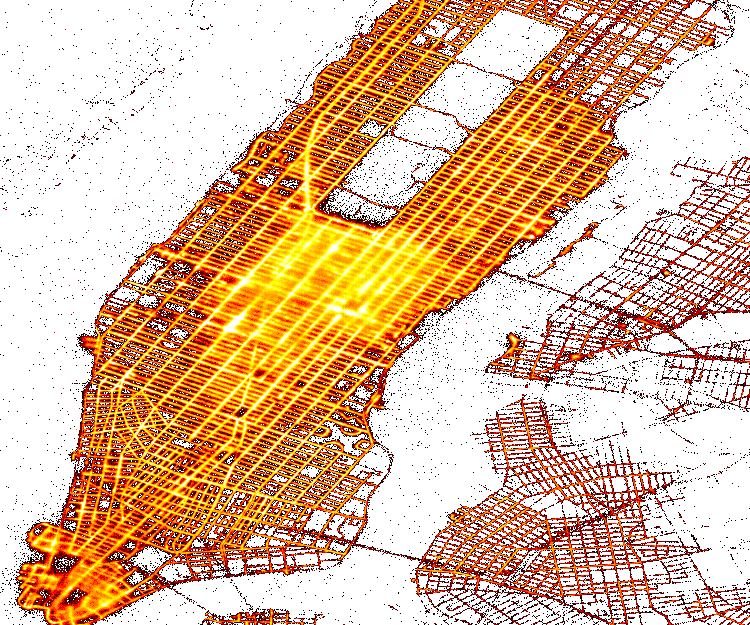

In [33]:
taxi2015['pu_x'], taxi2015['pu_y'] = makeXfilter(taxi2015['pickup_latitude'], taxi2015['pickup_longitude'])
taxi2015['do_x'], taxi2015['do_y'] = makeXfilter(taxi2015['dropoff_latitude'],taxi2015['dropoff_longitude'])
cvs = ds.Canvas(plot_width=750, plot_height=625, x_range=(-8239910.23,-8229529.24), y_range=(4968481.34,4983152.92)) # Create canvas
agg = cvs.points(taxi2015, 'do_x', 'do_y', ds.count('passenger_count')) # Perform aggregation
img = tf.shade(agg, cmap=Hot, how='eq_hist') # Produce image from aggregation

img # Display image

              x             y
0 -8.236963e+06  4.975553e+06
1 -8.237826e+06  4.971752e+06
2 -8.233561e+06  4.983296e+06
3 -8.238654e+06  4.970221e+06
4 -8.234434e+06  4.977363e+06
              x             y
0 -8.234835e+06  4.975627e+06
1 -8.237021e+06  4.976875e+06
2 -8.232279e+06  4.986477e+06
3 -8.238124e+06  4.971127e+06
4 -8.238108e+06  4.974457e+06


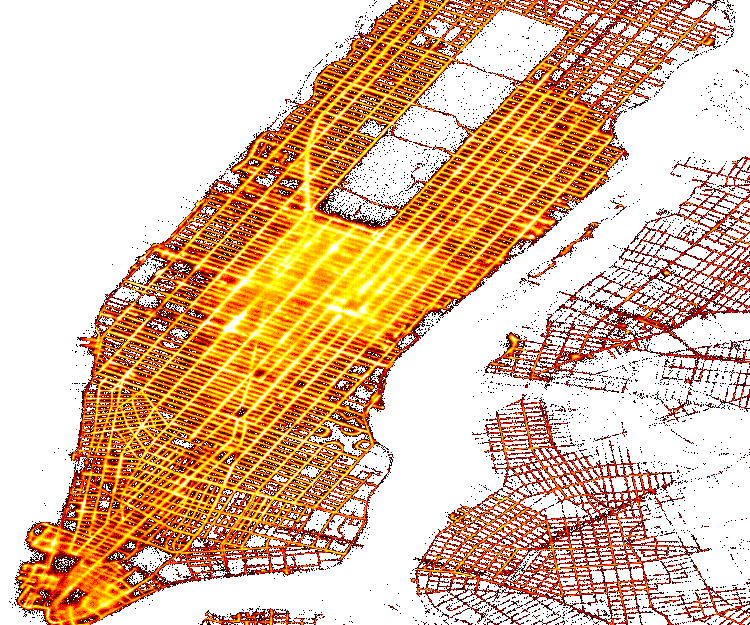

In [34]:
taxi_cuS_cleaned['pu_x'], taxi_cuS_cleaned['pu_y'] = makeXfilter(taxi_cuS_cleaned['pickup_latitude'], taxi_cuS_cleaned['pickup_longitude'])
taxi_cuS_cleaned['do_x'], taxi_cuS_cleaned['do_y'] = makeXfilter(taxi_cuS_cleaned['dropoff_latitude'],taxi_cuS_cleaned['dropoff_longitude'])
cvs = ds.Canvas(plot_width=750, plot_height=625, x_range=(-8239910.23,-8229529.24), y_range=(4968481.34,4983152.92)) # Create canvas
agg = cvs.points(taxi_cuS_cleaned, 'do_x', 'do_y', ds.count('passenger_count')) # Perform aggregation
img = tf.shade(agg, cmap=Hot, how='eq_hist') # Produce image from aggregation

img # Display image

## Cleaning using cuXFilter
(You may remember me from other notebooks like...)  

First, we're going to have a little fun with this.  All those new parameters we created will be put to use.  We're going to an interactive visualization on the whole `taxi2015` dataset.  In the end you'll be able to see:
1. original data pickups
1. original data dropoffs
1. cuSpatial cleaned pickups
1. cuSpatial cleaned dropoffs
1. original data and cleaned intraborough pickups
1. original data and cleaned intraborough dropoffs
1. original data and cleaned interborough pickups
1. original data and cleaned interborough dropoffs
1. and more!

To do this, we're going to 
1. convert the pickup and drop off coordinates from lat/lon to EPSG:4326 format
1. prep the bokeh server to show a background map to overlay our data
1. create some charts to plot pickup and drop off points
1. create some more charts to help filter the data by parameters of interest, like 
 1. pickup borough by borough
 1. dropoff borough by borough
 1. Whether the trip was interborough
 1. and a quick filter on whether or not the whole trip was within NYC's 5 boroughs (yes, the "easy button" cleaning filter)

In [95]:
import cuxfilter
from bokeh import palettes
from cuxfilter.layouts import double_feature

In [96]:
taxi2015['pu_x'], taxi2015['pu_y'] = makeXfilter(taxi2015['pickup_latitude'], taxi2015['pickup_longitude'])
taxi2015['do_x'], taxi2015['do_y'] = makeXfilter(taxi2015['dropoff_latitude'],taxi2015['dropoff_longitude'])
cux = cuxfilter.DataFrame.from_dataframe(taxi2015)

              x             y
0 -8.233007e+06  4.978421e+06
1 -8.235776e+06  4.974624e+06
2 -8.234722e+06  4.976201e+06
3 -8.235246e+06  4.965911e+06
4 -8.215919e+06  4.960896e+06
              x             y
0 -8.234597e+06  4.981905e+06
1 -8.235517e+06  4.971313e+06
2 -8.235345e+06  4.975060e+06
3 -8.236910e+06  4.966412e+06
4 -8.235764e+06  4.971472e+06


In [97]:
from bokeh.tile_providers import get_provider as gp
tile_provider = gp('CARTODBPOSITRON')

### Create your charts and launch the dashboard

In [98]:
label_map = {
    0:"external", 
    1:"Bronx",
    2:"Staten Island",
    3:"Brooklyn", 
    4:"Queens", 
    5:"Manhattan"
}
chart0 = cuxfilter.charts.scatter(x='pu_x',
                                      y='pu_y',
                                      title='NYC Taxi Pickups',
                                      aggregate_fn='count',
                                      tile_provider=tile_provider, x_range=(-8267428.97,-8207328.23), y_range=(4935861.67,5000548.55))
chart1 = cuxfilter.charts.scatter(x='do_x',
                                      y='do_y',
                                      title='NYC Taxi Dropoffs',
                                      aggregate_fn='count',
                                      tile_provider=tile_provider, x_range=(-8267428.97,-8207328.23), y_range=(4935861.67,5000548.55))
chart2 = cuxfilter.charts.multi_select('pickup_borough_integer', label_map=label_map)
chart3 = cuxfilter.charts.multi_select('dropoff_borough_integer', label_map=label_map)
chart4 = cuxfilter.charts.multi_select('day_of_the_month')
chart5 = cuxfilter.charts.multi_select('time_of_the_day')

In [99]:
# d = cux.dashboard([chart0, chart1, chart2, chart3, chart4, chart5], layout=cuxfilter.layouts.feature_and_base, theme=cuxfilter.themes.dark, title= 'NYC TAXI DATASET')
# d.show(url+':'+port)

In [100]:
d = cux.dashboard([chart0, chart1, chart2, chart3, chart4, chart5], layout=cuxfilter.layouts.double_feature, theme=cuxfilter.themes.dark, title= 'NYC TAXI DATASET')
d.show(notebook_url=url+':'+port)

Dashboard running at port 49727


Row
    [0] Button(button_type='success', name='open cuxfilter d...)

# WARNING!
Before you stop the data viz, please 
1. select all boroughs that aren't `external` in `pickup_borough_integer` and `dropoff_borough_integer`.  This will give you a cleaned dataset
1. Then, run the next cell to export the data in the visualizations as a dataframe.  

This will give you a similar result to the `taxi_cuS_cleaned` dataset.  Then, we'll stop the visualization and compare the two datasets for similarity, just to prove that they are the same.

In [40]:
taxi_cuX_cleaned = d.export()

final query pickup_borough_integer in (1,2,3,4,5) and dropoff_borough_integer in (1,2,3,4,5)


In [41]:
taxi_cuX_cleaned.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RateCodeID,store_and_fwd_flag,dropoff_longitude,...,pickup_borough_integer,dropoff_borough_integer,all_within_boroughs,interborough,day_of_the_month,time_of_the_day,pu_x,pu_y,do_x,do_y
0,2,2015-01-15 19:05:39,2015-01-15 19:23:42,1,1.59,-73.993896,40.750111,1,N,-73.974785,...,5,5,True,False,15,19,-8.236963e+06,4.975553e+06,-8.234835e+06,4.975627e+06
1,1,2015-01-10 20:33:38,2015-01-10 20:53:28,1,3.30,-74.001648,40.724243,1,N,-73.994415,...,5,5,True,False,10,20,-8.237826e+06,4.971752e+06,-8.237021e+06,4.976875e+06
2,1,2015-01-10 20:33:38,2015-01-10 20:43:41,1,1.80,-73.963341,40.802788,1,N,-73.951820,...,5,5,True,False,10,20,-8.233561e+06,4.983296e+06,-8.232279e+06,4.986477e+06
3,1,2015-01-10 20:33:39,2015-01-10 20:35:31,1,0.50,-74.009087,40.713818,1,N,-74.004326,...,5,5,True,False,10,20,-8.238654e+06,4.970221e+06,-8.238124e+06,4.971127e+06
4,1,2015-01-10 20:33:39,2015-01-10 20:52:58,1,3.00,-73.971176,40.762428,1,N,-74.004181,...,5,5,True,False,10,20,-8.234434e+06,4.977363e+06,-8.238108e+06,4.974457e+06


In [44]:
d.stop()

# Comparing the data
Let's checking that the data between the cleaned datasets, `taxi_cuS_cleaned` and `taxi_cuX_cleaned` are the same.

In [42]:
print(taxi_cuX_cleaned.head())
print(taxi_cuS_cleaned.head())
print(taxi_cuX_cleaned.count())
print(taxi_cuS_cleaned.count())

   VendorID tpep_pickup_datetime tpep_dropoff_datetime  passenger_count  \
0         2  2015-01-15 19:05:39   2015-01-15 19:23:42                1   
1         1  2015-01-10 20:33:38   2015-01-10 20:53:28                1   
2         1  2015-01-10 20:33:38   2015-01-10 20:43:41                1   
3         1  2015-01-10 20:33:39   2015-01-10 20:35:31                1   
4         1  2015-01-10 20:33:39   2015-01-10 20:52:58                1   

   trip_distance  pickup_longitude  pickup_latitude  RateCodeID  \
0           1.59        -73.993896        40.750111           1   
1           3.30        -74.001648        40.724243           1   
2           1.80        -73.963341        40.802788           1   
3           0.50        -74.009087        40.713818           1   
4           3.00        -73.971176        40.762428           1   

  store_and_fwd_flag  dropoff_longitude  ...  pickup_borough_integer  \
0                  N         -73.974785  ...                       5   
1 

So far, so good.  Now let's compare each element in each column and row.

In [43]:
print(taxi_cuX_cleaned.columns)
print(taxi_cuS_cleaned.columns)
for i in range(0, len(taxi_cuS_cleaned.columns)):
               diff = (taxi_cuX_cleaned.iloc[:,i] != taxi_cuS_cleaned.iloc[:,i]).sum()
               print("# of differences in column " + taxi_cuX_cleaned.columns[i]+ ': ', diff)

Index(['VendorID', 'tpep_pickup_datetime', 'tpep_dropoff_datetime',
       'passenger_count', 'trip_distance', 'pickup_longitude',
       'pickup_latitude', 'RateCodeID', 'store_and_fwd_flag',
       'dropoff_longitude', 'dropoff_latitude', 'payment_type', 'fare_amount',
       'extra', 'mta_tax', 'tip_amount', 'tolls_amount',
       'improvement_surcharge', 'total_amount', 'pickup_borough',
       'dropoff_borough', 'pickup_borough_integer', 'dropoff_borough_integer',
       'all_within_boroughs', 'interborough', 'day_of_the_month',
       'time_of_the_day', 'pu_x', 'pu_y', 'do_x', 'do_y'],
      dtype='object')
Index(['VendorID', 'tpep_pickup_datetime', 'tpep_dropoff_datetime',
       'passenger_count', 'trip_distance', 'pickup_longitude',
       'pickup_latitude', 'RateCodeID', 'store_and_fwd_flag',
       'dropoff_longitude', 'dropoff_latitude', 'payment_type', 'fare_amount',
       'extra', 'mta_tax', 'tip_amount', 'tolls_amount',
       'improvement_surcharge', 'total_amount', 'p

These should all be 0.  Hooray! (if not, you didn't follow directions :) )

## Simple Time Based Ridership Analysis

In [45]:
day_freq = cudf.DataFrame()
day_freq = taxi2015['day_of_the_month'].value_counts().reset_index()
day_freq['# of Rides'] = day_freq['day_of_the_month']
day_freq['Day of the Month'] = day_freq['index']
print(day_freq)

    index  day_of_the_month  # of Rides  Day of the Month
0      31            520067      520067                31
1      10            515540      515540                10
2      30            483380      483380                30
3      16            478124      478124                16
4      17            476827      476827                17
5      23            472440      472440                23
6      24            460505      460505                24
7      22            452108      452108                22
8      15            451186      451186                15
9       8            450920      450920                 8
10     13            448517      448517                13
11      9            447947      447947                 9
12     14            442656      442656                14
13     29            431985      431985                29
14     21            431486      431486                21
15      7            429653      429653                 7
16     18     

In [46]:
#groupby of day of moth and rides
tod_freq = taxi_cuS_cleaned.groupby(['day_of_the_month', 'time_of_the_day']).agg({'VendorID':'count'}).reset_index()
tod_freq = tod_freq.rename(columns={"VendorID": "count"})


In [47]:
tod_dist = taxi_cuS_cleaned.groupby(['day_of_the_month', 'time_of_the_day']).agg({'trip_distance':'sum'}).reset_index()

In [48]:
tod_dist

,day_of_the_month,time_of_the_day,trip_distance
0,1,0,79879.98
1,1,1,96205.97
2,1,2,88719.72
3,1,3,80922.82
4,1,4,60177.86
...,...,...,...
739,31,19,74077.46
740,31,20,4481723.27
741,31,21,66117.29
742,31,22,126106.83


In [49]:
tod_freq.head()

,day_of_the_month,time_of_the_day,count
0,1,0,27559
1,1,1,30825
2,1,2,27150
3,1,3,23501
4,1,4,16442


In [50]:
gdf = cudf.from_pandas(tod_freq.to_pandas().set_index(['time_of_the_day', 'day_of_the_month']).unstack(level=0)).reset_index()
ddf = cudf.from_pandas(tod_dist.to_pandas().set_index(['time_of_the_day', 'day_of_the_month']).unstack(level=0)).reset_index()

In [51]:
gdf=gdf.reset_index()
ddf =ddf.reset_index()

In [52]:
gdf.head()

index day_of_the_month  count                              \
time_of_the_day                             0      1      2      3      4   
0                   0                1  27559  30825  27150  23501  16442   
1                   1                2   9161   6138   3922   2825   2497   
2                   2                3  19012  16270  13241  10288   6823   
3                   3                4  20252  17165  13208   9588   6172   
4                   4                5   7457   4558   2964   2005   2221   

                                     ...                                     \
time_of_the_day     5      6      7  ...     14     15     16     17     18   
0                8772   6367   5787  ...  17440  17744  16152  17029  17615   
1                2606   5586   8019  ...  19651  19808  17742  20133  22359   
2                3365   3932   5053  ...  23596  22890  19901  21831  24853   
3                3211   3482   4590  ...  18305  17819  17656  17921  18117   
4                4064  10800  18487  ...  18435  19324  17209  21199  25542   

                                                    
time_of_the_day     19     20     21     22     23  
0                16078  14654  14360  13660  11310  
1                22594  19619  19124  21191  20572  
2                25179  20134  20961  21984  22423  
3                18156  17200  13765  12404   9985  
4                24994  21462  19300  15830  12390  

[5 rows x 26 columns]

In [53]:
list(gdf['count'].columns)

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23]

In [54]:
gdf.dtypes

index                   int64
day_of_the_month        int64
count             0     int32
                  1     int32
                  2     int32
                  3     int32
                  4     int32
                  5     int32
                  6     int32
                  7     int32
                  8     int32
                  9     int32
                  10    int32
                  11    int32
                  12    int32
                  13    int32
                  14    int32
                  15    int32
                  16    int32
                  17    int32
                  18    int32
                  19    int32
                  20    int32
                  21    int32
                  22    int32
                  23    int32
dtype: object

In [55]:
tdf = gdf['count']
tdf['day_of_the_month'] = gdf['day_of_the_month']
tdf[[0, 1]].to_csv('two_days.csv')
tdf[[0, 1]].head(50)

time_of_the_day,0,1
,,
0,27559,30825
1,9161,6138
2,19012,16270
3,20252,17165
4,7457,4558
5,8201,4791
6,8917,5399
7,10108,5817
8,13537,8102


In [56]:
tddf = ddf['trip_distance']
tddf['day_of_the_month'] = ddf['day_of_the_month']

In [57]:
tdf = tdf.rename(columns={0: "0"})
tdf = tdf.rename(columns={1: "1"})

In [58]:
tdf.dtypes

0                   int32
1                   int32
2                   int32
3                   int32
4                   int32
5                   int32
6                   int32
7                   int32
8                   int32
9                   int32
10                  int32
11                  int32
12                  int32
13                  int32
14                  int32
15                  int32
16                  int32
17                  int32
18                  int32
19                  int32
20                  int32
21                  int32
22                  int32
23                  int32
day_of_the_month    int64
dtype: object

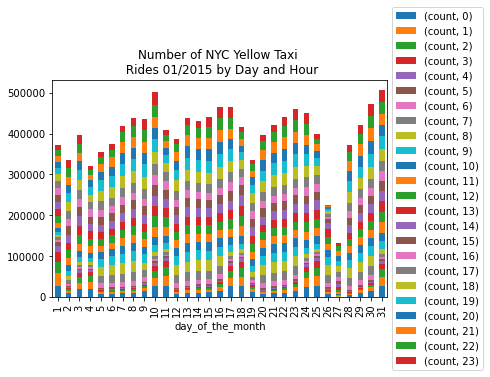

In [59]:
df = tod_freq.to_pandas().set_index(['time_of_the_day', 'day_of_the_month']).unstack(level=0)
import matplotlib.pyplot as plt

f = plt.figure()

plt.title('Number of NYC Yellow Taxi \n Rides 01/2015 by Day and Hour', color='black')
df.plot(kind='bar', stacked=True, ax=f.gca())
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.show()

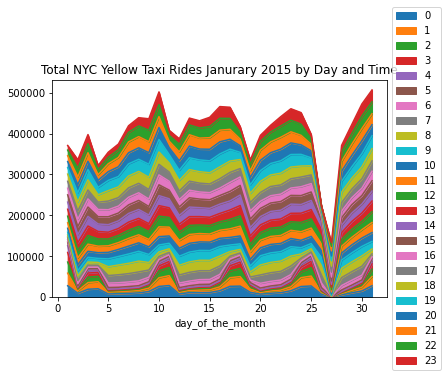

In [60]:
df = tdf.to_pandas().set_index(['day_of_the_month'])
import matplotlib.pyplot as plt

f = plt.figure()

plt.title('Total NYC Yellow Taxi Rides Janurary 2015 by Day and Time', color='black')
df.plot(kind='area', stacked=True, ax=f.gca())
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.show()

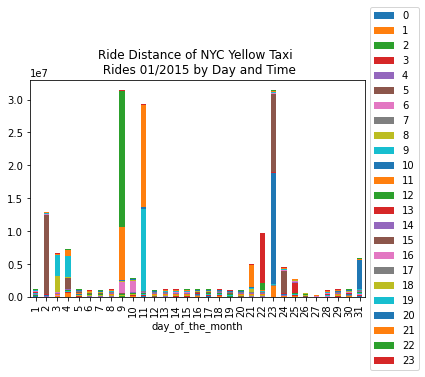

In [61]:
df = tddf.to_pandas().set_index(['day_of_the_month'])
import matplotlib.pyplot as plt

f = plt.figure()


plt.title('Ride Distance of NYC Yellow Taxi \n Rides 01/2015 by Day and Time', color='black')
df.plot(kind='bar', stacked=True, ax=f.gca())
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.show()

In [63]:
taxi_cuX_cleaned["trip_distance"].describe()

count    1.243419e+07
mean     1.369953e+01
std      9.967927e+03
min      0.000000e+00
25%      1.000000e+00
50%      1.680000e+00
75%      3.000000e+00
max      1.542000e+07
Name: trip_distance, dtype: float64

In [64]:
del taxi_cuS_cleaned

In [65]:
df_subset = taxi_cuX_cleaned[(taxi_cuX_cleaned["trip_distance"] <= 100)]

In [66]:
df_subset.describe()

,VendorID,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RateCodeID,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,...,improvement_surcharge,total_amount,pickup_borough_integer,dropoff_borough_integer,day_of_the_month,time_of_the_day,pu_x,pu_y,do_x,do_y
count,1.243404e+07,1.243404e+07,1.243404e+07,1.243404e+07,1.243404e+07,1.243404e+07,1.243404e+07,1.243404e+07,1.243404e+07,1.243404e+07,...,1.243404e+07,1.243404e+07,1.243404e+07,1.243404e+07,1.243404e+07,1.243404e+07,1.243404e+07,1.243404e+07,1.243404e+07,1.243404e+07
mean,1.527423e+00,1.687517e+00,2.753356e+00,-7.397470e+01,4.075113e+01,1.024083e+00,-7.397408e+01,4.075184e+01,1.385892e+00,1.170275e+01,...,2.833910e-01,1.486425e+01,4.909436e+00,4.826164e+00,1.603385e+01,1.357605e+01,-8.234826e+06,4.975703e+06,-8.234757e+06,4.975808e+06
std,4.992470e-01,1.344491e+00,3.283875e+00,3.528500e-02,2.694500e-02,5.423270e-01,3.163000e-02,3.058700e-02,4.981500e-01,9.377839e+00,...,6.860600e-02,1.120415e+03,3.584650e-01,5.600720e-01,8.779614e+00,6.407560e+00,3.927949e+03,3.958639e+03,3.521016e+03,4.494101e+03
min,1.000000e+00,0.000000e+00,0.000000e+00,-7.423229e+01,4.052760e+01,1.000000e+00,-7.425122e+01,4.050146e+01,1.000000e+00,-2.500000e+02,...,0.000000e+00,-2.503000e+02,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,-8.263500e+06,4.942911e+06,-8.265608e+06,4.939083e+06
25%,1.000000e+00,1.000000e+00,1.000000e+00,-7.399186e+01,4.073720e+01,1.000000e+00,-7.399129e+01,4.073611e+01,1.000000e+00,6.500000e+00,...,3.000000e-01,8.160000e+00,5.000000e+00,5.000000e+00,9.000000e+00,9.000000e+00,-8.236736e+06,4.973656e+06,-8.236673e+06,4.973495e+06
50%,2.000000e+00,1.000000e+00,1.680000e+00,-7.398193e+01,4.075401e+01,1.000000e+00,-7.398016e+01,4.075443e+01,1.000000e+00,9.000000e+00,...,3.000000e-01,1.115000e+01,5.000000e+00,5.000000e+00,1.600000e+01,1.400000e+01,-8.235631e+06,4.976126e+06,-8.235434e+06,4.976187e+06
75%,2.000000e+00,2.000000e+00,3.000000e+00,-7.396792e+01,4.076797e+01,1.000000e+00,-7.396388e+01,4.076924e+01,2.000000e+00,1.350000e+01,...,3.000000e-01,1.630000e+01,5.000000e+00,5.000000e+00,2.300000e+01,1.900000e+01,-8.234071e+06,4.978177e+06,-8.233621e+06,4.978365e+06
max,2.000000e+00,9.000000e+00,1.000000e+02,-7.370171e+01,4.091285e+01,9.900000e+01,-7.370049e+01,4.091369e+01,5.000000e+00,4.008000e+03,...,3.000000e-01,3.950612e+06,5.000000e+00,5.000000e+00,3.100000e+01,2.300000e+01,-8.204437e+06,4.999496e+06,-8.204300e+06,4.999619e+06


In [67]:
df_subset.dtypes

VendorID                           int64
tpep_pickup_datetime       datetime64[s]
tpep_dropoff_datetime             object
passenger_count                    int64
trip_distance                    float64
pickup_longitude                 float64
pickup_latitude                  float64
RateCodeID                         int64
store_and_fwd_flag                object
dropoff_longitude                float64
dropoff_latitude                 float64
payment_type                       int64
fare_amount                      float64
extra                            float64
mta_tax                          float64
tip_amount                       float64
tolls_amount                     float64
improvement_surcharge            float64
total_amount                     float64
pickup_borough                    object
dropoff_borough                   object
pickup_borough_integer             int32
dropoff_borough_integer            int32
all_within_boroughs                 bool
interborough    

In [68]:
import math
from math import cos, sin, asin, sqrt, pi

def haversine_distance_kernel_gpu(pickup_latitude, pickup_longitude, dropoff_latitude, dropoff_longitude, h_distance):
    for i, (x_1, y_1, x_2, y_2) in enumerate(zip(pickup_latitude, pickup_longitude, dropoff_latitude, dropoff_longitude)):
        x_1 = pi/180 * x_1
        y_1 = pi/180 * y_1
        x_2 = pi/180 * x_2
        y_2 = pi/180 * y_2
        
        dlon = y_2 - y_1
        dlat = x_2 - x_1
        a = sin(dlat/2)**2 + cos(x_1) * cos(x_2) * sin(dlon/2)**2
        
        c = 2 * asin(sqrt(a)) 
        r = 6371 # Radius of earth in kilometers
        
        h_distance[i] = c * r
  
def add_features_gpu(df):
    df['pickup_hour'] = df['tpep_pickup_datetime'].dt.hour
    df['pickup_year'] = df['tpep_pickup_datetime'].dt.year
    df['pickup_month'] = df['tpep_pickup_datetime'].dt.month
    df['pickup_day'] = df['tpep_pickup_datetime'].dt.day
    
#     df['dropoff_hour'] = df['tpep_dropoff_datetime'].dt.hour
#     df['dropoff_year'] = df['tpep_dropoff_datetime'].dt.year
#     df['dropoff_month'] = df['tpep_dropoff_datetime'].dt.month
#     df['dropoff_day'] = df['tpep_dropoff_datetime'].dt.day
    
    df['pickup_latitude_r'] = df['pickup_latitude']//.01*.01
    df['pickup_longitude_r'] = df['pickup_longitude']//.01*.01
    df['dropoff_latitude_r'] = df['dropoff_latitude']//.01*.01
    df['dropoff_longitude_r'] = df['dropoff_longitude']//.01*.01
    df["day_of_week"] = df["tpep_pickup_datetime"].dt.dayofweek
    
    df = df.drop(columns=['tpep_pickup_datetime', 'tpep_dropoff_datetime'])    
 
    df['is_weekend'] = (df['day_of_week'] >= 5).astype(np.int32)
    return df

def compute_distance_gpu(df):
    df = df.apply_rows(haversine_distance_kernel_gpu,
                   incols=['pickup_latitude', 'pickup_longitude', 'dropoff_latitude', 'dropoff_longitude'],
                   outcols=dict(h_distance=np.float32),
                   kwargs=dict())
    return df

In [69]:

%%time

# TODO: actually add the features and create "taxi_gdf" from gdf_subset

# Answer
#taxi_gdf = add_features_gpu(taxi_gdf)
taxi_gdf = add_features_gpu(df_subset)

CPU times: user 31.2 ms, sys: 32 ms, total: 63.2 ms
Wall time: 65.5 ms


In [70]:

%%time

# TODO: add the distance calculation

# *** Answer
taxi_gdf = compute_distance_gpu(taxi_gdf)

CPU times: user 384 ms, sys: 28 ms, total: 412 ms
Wall time: 411 ms


In [71]:
taxi_gdf=taxi_gdf.drop(columns=['all_within_boroughs','store_and_fwd_flag','pickup_borough','dropoff_borough'])
taxi_gdf['interborough']=taxi_gdf['interborough'].astype('int8')

In [72]:
taxi_gdf.dtypes

VendorID                     int64
passenger_count              int64
trip_distance              float64
pickup_longitude           float64
pickup_latitude            float64
RateCodeID                   int64
dropoff_longitude          float64
dropoff_latitude           float64
payment_type                 int64
fare_amount                float64
extra                      float64
mta_tax                    float64
tip_amount                 float64
tolls_amount               float64
improvement_surcharge      float64
total_amount               float64
pickup_borough_integer       int32
dropoff_borough_integer      int32
interborough                  int8
day_of_the_month             int16
time_of_the_day              int16
pu_x                       float64
pu_y                       float64
do_x                       float64
do_y                       float64
pickup_hour                  int16
pickup_year                  int16
pickup_month                 int16
pickup_day          

In [73]:
import cuml.cluster
from cuml.experimental.preprocessing import StandardScaler
cu_kmeans = cuml.cluster.KMeans(n_clusters=5, init="k-means++", random_state=42)
scaler = StandardScaler()
train_clusters_gpu = cu_kmeans.fit_predict(scaler.fit_transform(taxi_gdf))

In [74]:
train_clusters_gpu.value_counts()

0    4059555
4    3560684
3    3326579
2    1050832
1     436395
dtype: int32

/home/taurean/miniconda3/envs/rapids-0.16/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


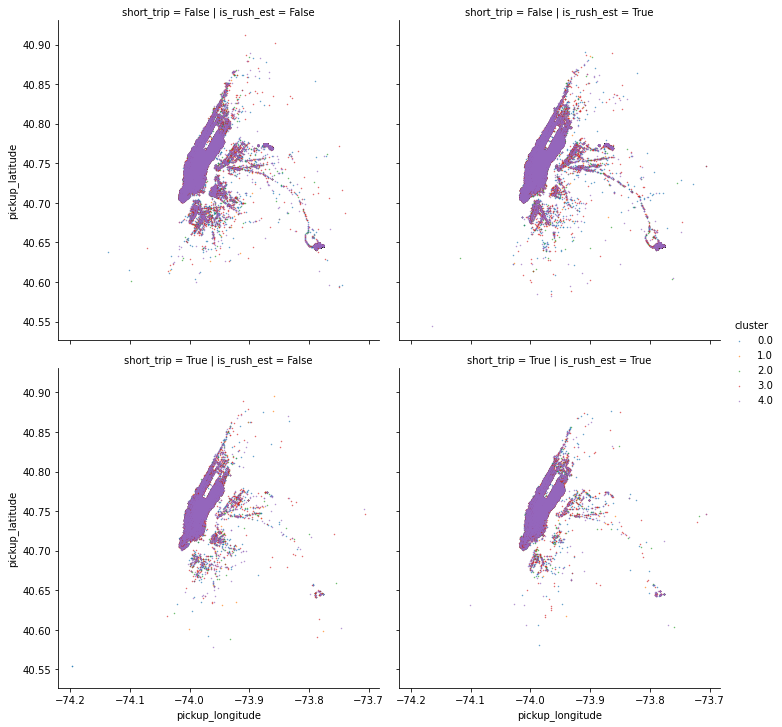

In [76]:
import seaborn as sns

# Just take a subset to speed plotting
max_samples = 400000
gdf_head = taxi_gdf.iloc[:max_samples]
gdf_head["cluster"] = train_clusters_gpu[:max_samples]
gdf_head["short_trip"] = gdf_head["trip_distance"] < 1.01 # About the 25th percentile
gdf_head["is_rush_est"] = ((gdf_head.pickup_hour >= 5) & (gdf_head.pickup_hour <= 10)) | \
                                ((gdf_head.pickup_hour >= 15) & (gdf_head.pickup_hour <= 19))

# actually do the plot
sns.lmplot("pickup_longitude", "pickup_latitude", data=gdf_head.to_pandas(),
           hue="cluster", col="is_rush_est", row="short_trip", fit_reg=False, scatter_kws={"s": 0.2})

In [77]:
del gdf_head

In [78]:
taxi_gdf["trip_distance"].describe()

count    1.243404e+07
mean     2.753356e+00
std      3.283875e+00
min      0.000000e+00
25%      1.000000e+00
50%      1.680000e+00
75%      3.000000e+00
max      1.000000e+02
Name: trip_distance, dtype: float64

In [79]:
taxi_gdf["cluster"]=train_clusters_gpu

In [80]:
train_clusters_gpu.count

<bound method Series.count of 0           3
1           3
2           0
3           3
4           3
           ..
12434040    0
12434041    3
12434042    0
12434043    3
12434044    0
Length: 12434045, dtype: int32>

In [82]:
cux2 = cuxfilter.DataFrame.from_dataframe(taxi_gdf)
chart0 = cuxfilter.charts.scatter(x='pickup_longitude',
                                      y='pickup_latitude',
                                      title='Kmeans Clustered NYC Taxi Pickups',
                                     aggregate_col='cluster',
                                     aggregate_fn='mean',
                                     pixel_shade_type='linear',
                                     legend_position='right')
chart1 = cuxfilter.charts.scatter(x='pu_x',
                                      y='pu_y',
                                      title='Original NYC Taxi Pickups',
                                      aggregate_fn='count',
                                      tile_provider=tile_provider, x_range=(-8267428.97,-8207328.23), y_range=(4935861.67,5000548.55))
chart2 = cuxfilter.charts.multi_select('cluster')
chart3 = cuxfilter.charts.range_slider('trip_distance')
chart4 = cuxfilter.charts.range_slider('h_distance')
chart5 = cuxfilter.charts.multi_select('is_weekend')
chart6 = cuxfilter.charts.multi_select('pickup_hour')
chart7 = cuxfilter.charts.multi_select('day_of_the_month')
chart8 = cuxfilter.charts.range_slider('pickup_longitude')
chart9 = cuxfilter.charts.range_slider('pickup_latitude')
chart10 = cuxfilter.charts.multi_select('pickup_borough_integer', label_map=label_map)
chart11 = cuxfilter.charts.multi_select('dropoff_borough_integer', label_map=label_map)



In [83]:
d = cux2.dashboard([chart0, chart1, chart2, chart3, chart4, chart5, chart6, chart7, chart8, chart9, chart10, chart11], layout=cuxfilter.layouts.double_feature, theme=cuxfilter.themes.dark, title= 'NYC TAXI DATASET')
d.show(notebook_url=url+':'+port)

Dashboard running at port 47931


Row
    [0] Button(button_type='success', name='open cuxfilter d...)

In [92]:
d.stop()

AttributeError: 'NoneType' object has no attribute '_stopped'

# Analyzing interesting interborough behaviours of NYCers
So now that we have cleaned data of yellow cab trips, and verified it vusially using cuXFilter, we can use cuSpatial to see who is coming from where and why. One bit of curiousness is why, unlike the rest of the region, does Rockaway/Seaside have so many dropoffs, not almost no pickups.  This happens both with interborough and intraborough travel.  It's also Janurary, so nature tourism seems...unlikely.  Let's find out where these people are coming from.

To begin, we have to make a box with the latitudes and longitudes of our area of interest
40.633869, -73.748353
40.559571, -73.877628

In [85]:
pu_points_inside = cuspatial.points_in_spatial_window(
    40.559571,   40.633869, -73.877628,-73.748353, taxi2015['pickup_latitude'], taxi2015['pickup_longitude']
)
print(pu_points_inside.shape[0])
print(pu_points_inside)

431
             x          y
0    40.625736 -73.781059
1    40.617474 -73.778610
2    40.596291 -73.766205
3    40.598007 -73.775963
4    40.591187 -73.751930
..         ...        ...
426  40.615307 -73.779839
427  40.630901 -73.781769
428  40.593876 -73.769615
429  40.597389 -73.772484
430  40.592342 -73.816307

[431 rows x 2 columns]


In [86]:
do_points_inside = cuspatial.points_in_spatial_window(
    40.559571,   40.633869,-73.877628, -73.748353, taxi2015['dropoff_latitude'], taxi2015['dropoff_longitude']
)
print(do_points_inside.shape[0])
print(do_points_inside)

1453
              x          y
0     40.625492 -73.780495
1     40.618229 -73.779617
2     40.596161 -73.766403
3     40.600056 -73.763321
4     40.597908 -73.776009
...         ...        ...
1448  40.593910 -73.755951
1449  40.596855 -73.772598
1450  40.599525 -73.782089
1451  40.574512 -73.858978
1452  40.590324 -73.797195

[1453 rows x 2 columns]


So, that's over 3x the pickup traffic.  Where is this influx coming from?  Let's merge back the other data on these points.

In [87]:
pickups = pickups*1
dropoffs = dropoffs*1
taxi2015 = taxi2015.join(pickups)

In [88]:
taxi2015.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RateCodeID,store_and_fwd_flag,dropoff_longitude,...,time_of_the_day,pu_x,pu_y,do_x,do_y,Bronx,Staten Island,Brooklyn,Queens,Manhattan
29600,2,2015-01-13 22:38:00,2015-01-13 22:47:35,1,2.53,-73.958359,40.769627,1,N,-73.972641,...,22,-8.233007e+06,4.978421e+06,-8.234597e+06,4.981905e+06,0,0,0,0,1
29601,2,2015-01-13 22:38:00,2015-01-13 22:47:08,1,2.18,-73.983238,40.743793,1,N,-73.980911,...,22,-8.235776e+06,4.974624e+06,-8.235517e+06,4.971313e+06,0,0,0,0,1
29602,1,2015-01-09 15:15:06,2015-01-09 15:18:06,1,0.60,-73.973770,40.754524,1,N,-73.979362,...,15,-8.234722e+06,4.976201e+06,-8.235345e+06,4.975060e+06,0,0,0,0,1
29603,1,2015-01-09 15:15:06,2015-01-09 15:23:09,1,0.90,-73.978470,40.684464,1,N,-73.993423,...,15,-8.235246e+06,4.965911e+06,-8.236910e+06,4.966412e+06,0,0,1,0,0
29604,2,2015-01-15 22:04:12,2015-01-15 22:32:19,1,17.45,-73.804855,40.650291,2,N,-73.983124,...,22,-8.215919e+06,4.960896e+06,-8.235764e+06,4.971472e+06,0,0,0,1,0


In [89]:
taxi2015['x'] = taxi2015['dropoff_latitude']
taxi2015['y'] = taxi2015['dropoff_longitude']
rwys = do_points_inside.merge(taxi2015)

Let's also do some time analysis and see the frequency of rides per day.  This requires us to modify the date a bit.

In [90]:
day_freq = cudf.DataFrame()
day_freq = rwys['day_of_the_month'].value_counts().reset_index()
day_freq['# of Rides'] = day_freq['day_of_the_month']
day_freq['Day of the Month'] = day_freq['index']
print(day_freq)

    index  day_of_the_month  # of Rides  Day of the Month
0      20               135         135                20
1       8                97          97                 8
2      12                97          97                12
3      13                94          94                13
4      14                84          84                14
5       9                78          78                 9
6      10                63          63                10
7      11                58          58                11
8       7                51          51                 7
9      22                48          48                22
10     21                45          45                21
11      4                44          44                 4
12      6                44          44                 6
13     17                44          44                17
14     30                43          43                30
15      1                41          41                 1
16      5     

In [91]:
cux = cuxfilter.DataFrame.from_dataframe(day_freq)
chart1 = cuxfilter.charts.bar("Day of the Month", "# of Rides")
d = cux.dashboard([chart1], layout=cuxfilter.layouts.single_feature, theme=cuxfilter.themes.dark, title= 'NYC TAXI DATASET')
chart1.view()

Column(sizing_mode='scale_both', width=400)
    [0] Bokeh(Figure)
    [1] RangeSlider(end=31, sizing_mode='scale_width', start=1, step=1, value=(1, 31), width=400)

As you can see, there was a spike of rides on the 19th of Janurary.  But where were they all from?

Let's look at a heatmap of `Day of Month` and `Boroughs` filtered on `Time of Day` 

Recall: 
label_map = {
    0:"external", 
    1:"Bronx",
    2:"Staten Island",
    3:"Brooklyn", 
    4:"Queens", 
    5:"Manhattan"
}

In [101]:
rwys = rwys.sort_values(['day_of_the_month'])

In [104]:
from cuxfilter import layouts, themes, DataFrame
from cuxfilter.charts import heatmap
from cuxfilter.charts import stacked_lines

rwys = rwys.sort_values(['day_of_the_month'])
cux = cuxfilter.DataFrame.from_dataframe(rwys)
chart0 = heatmap(y='pickup_borough_integer', x='day_of_the_month', aggregate_fn='count',
                            color_palette=list(palettes.inferno(256)), point_size=20)
chart1 = cuxfilter.charts.multi_select('time_of_the_day')
chart2 = cuxfilter.charts.multi_select('pickup_borough_integer', label_map=label_map)
chart3 = cuxfilter.charts.multi_select('dropoff_borough_integer', label_map=label_map)
d = cux.dashboard([chart0, chart1, chart2, chart3], layout=layouts.single_feature, theme=themes.dark)
d.show(url+':'+port)


Dashboard running at port 44989


Row
    [0] Button(button_type='success', name='open cuxfilter d...)

You should see that the spike of rides started to occur after 4PM on the 19th.  What's more, they were from pick ups that happened from outside of the 5 boroughs.  That's interesting, but we'll need to map this out.  For now, let's move on to the other days of high ridership.

In [105]:
d.stop()

Let's examine the other days looking at `Time of Day` and `Boroughs` filtered on `Day of Month`

Recall:
label_map = {
    0:"external", 
    1:"Bronx",
    2:"Staten Island",
    3:"Brooklyn", 
    4:"Queens", 
    5:"Manhattan"
}

In [106]:
chart0 = heatmap(y='pickup_borough_integer', x='time_of_the_day', aggregate_fn='count',
                            color_palette=list(palettes.inferno(256)), point_size=20)
chart1 = cuxfilter.charts.multi_select('day_of_the_month')
chart2 = cuxfilter.charts.multi_select('pickup_borough_integer', label_map=label_map)
chart3 = cuxfilter.charts.multi_select('dropoff_borough_integer', label_map=label_map)
d = cux.dashboard([chart0, chart1, chart2, chart3], layout=layouts.single_feature, theme=themes.dark)
d.show(url+':'+port)

Dashboard running at port 56431


Row
    [0] Button(button_type='success', name='open cuxfilter d...)

In [ ]:
d.stop()

On the 24 hour clock, for 7th, 11th, and 12th, it seems like most of the rides to the rockaways are at mid day from Queens, at the 9PM hour.  Let's verify this and see where those rides come from.  We'll do this by once again using the `scatter_geo` plot and having some `multi_select` filters

### Now to create the charts

In [ ]:
rwys['rwys_x'], rwys['rwys_y'] = makeXfilter(rwys['pickup_latitude'], rwys['pickup_longitude'])
cux = cuxfilter.DataFrame.from_dataframe(rwys)
chart1 = cuxfilter.charts.scatter_geo(x='rwys_x',
                                      y='rwys_y',
                                      title='Where are the drop offs coming from?',
                                         add_interaction=True , 
                                         color_palette=palettes.inferno(256) , # use bokeh color palettes to get more pop out colors
                                         aggregate_col='time_of_the_day' , aggregate_fn='max',
                                         tile_provider=tile_provider, x_range=(-8267428.97,-8207328.23), y_range=(4935861.67,5000548.55))
chart2 = cuxfilter.charts.multi_select('pickup_borough_integer', label_map=label_map)
chart3 = cuxfilter.charts.multi_select('dropoff_borough_integer', label_map=label_map)
chart4 = cuxfilter.charts.multi_select('day_of_the_month')
chart5 = cuxfilter.charts.multi_select('time_of_the_day')

In [ ]:
d = cux.dashboard([chart1, chart2, chart3, chart4, chart5], layout=cuxfilter.layouts.single_feature, theme=cuxfilter.themes.dark, title= 'NYC TAXI DATASET')
d.show(url+':'+port)

Many of the pick up points seem to be at LaGuardia and JFK airports.

In [ ]:
d.stop()